# Imports

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from tensorflow.keras import utils 
from keras.models import Model
from keras.layers import concatenate
from keras.layers import Input, Dense, Flatten, Dropout, LSTM, Conv2D, MaxPool2D, TimeDistributed, BatchNormalization
from keras.layers.convolutional import Conv1D, MaxPooling1D
import tensorflow as tf
from tensorflow import keras
tf.config.run_functions_eagerly(True)

from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay
import matplotlib.image as mpimg

import seaborn as sns

# device_name = tf.test.gpu_device_name()
# if device_name != '/device:GPU:0':
#   raise SystemError('GPU device not found')
# print('Found GPU at: {}'.format(device_name))

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import os
os.chdir('drive/MyDrive/eyetrack')

# Load training data (example)

In [ ]:
X_balanced_all_images = np.load('clean/arousal_clean/X_balanced_all_images_arousal_clean.npy')
X_balanced_arousal_images = np.load('clean/arousal_clean/X_balanced_arousal_images_clean.npy')
X_balanced_arousal_time = np.load('clean/arousal_clean/X_balanced_arousal_time_clean.npy')
y_balanced_arousal = np.load('clean/arousal_clean/y_balanced_arousal_clean.npy')

In [ ]:
X_balanced_all_images.shape, X_balanced_arousal_images.shape, X_balanced_arousal_time.shape, y_balanced_arousal.shape

((4284, 200, 250, 3), (4284, 190, 190, 1), (4284, 1, 300, 5), (4284, 7))

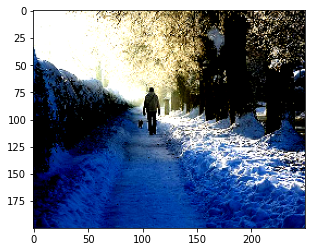

In [ ]:
plt.imshow(X_balanced_all_images[0]) # already normalized image 

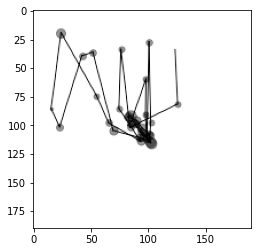

In [ ]:
plt.imshow(X_balanced_arousal_images[0, :, :, 0], cmap='Greys') # eyee tracking scanpath

In [ ]:
df = pd.DataFrame(dict(zip(['FPOGX', 'FPOGY', 'mean_PMM', 'GSR', 'HR'], X_balanced_arousal_time[0, 0])))
df.head() # all data normalized

,FPOGX,FPOGY,mean_PMM,GSR,HR
0,-0.433367,-0.399019,-0.368113,-0.348465,-0.246352
1,-0.186014,-0.178901,-0.164783,-0.152240,-0.140145
2,1.411644,1.431289,1.432253,1.438578,1.424884
3,-0.463144,-0.464883,-0.469580,-0.477770,-0.489712
4,-0.548335,-0.548335,-0.548335,-0.548335,-0.548335


In [ ]:
y_balanced_arousal[0].argmax(-1) # arousal value

4

# Load test data

In [ ]:
test_images = np.load('test_data/test_images.npy')
test_paths = np.load('test_data/test_paths.npy')
test_time = np.load('test_data/test_time.npy')
test_y_a = np.load('test_data/test_y_a.npy')
test_y_v = np.load('test_data/test_y_v.npy')

# Model

In [ ]:
p = 0.5
n_outputs = 7

# CNN

model1_in = Input(shape=(190, 190, 1))
model1_conv1 = Conv2D(filters=32, kernel_size=5, activation='relu')(model1_in)
model1_maxpool1 = MaxPool2D()(model1_conv1)

model1_conv2 = Conv2D(filters=64, kernel_size=5, activation='relu')(model1_maxpool1)
model1_maxpool2 = MaxPool2D()(model1_conv2)
model1_drop1 = Dropout(p)(model1_maxpool2)

model1_conv3 = Conv2D(filters=128, kernel_size=5, activation='relu')(model1_drop1)
model1_maxpool3 = MaxPool2D()(model1_conv3)
model1_maxpool3 = BatchNormalization()(model1_maxpool3)
model1_drop2 = Dropout(p)(model1_maxpool3)

model1_conv4 = Conv2D(filters=256, kernel_size=5, activation='relu')(model1_drop2)
model1_maxpool4 = MaxPool2D()(model1_conv4)
model1_drop3 = Dropout(p)(model1_maxpool4)

model1_flat = Flatten()(model1_drop3) #### first 
model1_dense1 = Dense(128, activation='relu')(model1_flat)
model1_dense1 = BatchNormalization()(model1_dense1)
model1_drop4 = Dropout(p)(model1_dense1)

model1 = Model(model1_in, model1_drop4, name='CNN')

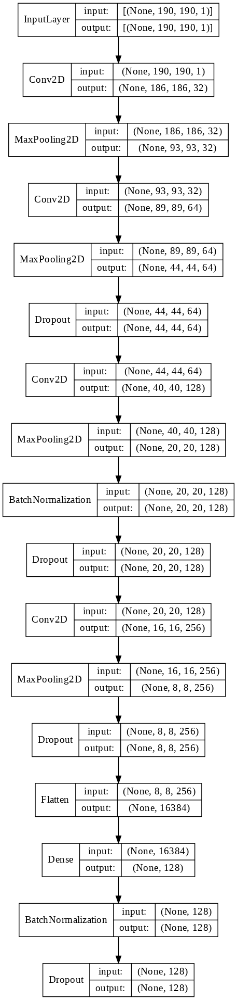

In [ ]:
tf.keras.utils.plot_model(model1, to_file='CNN_scanpaths.png', show_shapes=True, show_layer_names=False, dpi=100)

In [ ]:
n_timesteps, n_features = 300, 5

# CNN-LSTM

model2_in = Input(shape=(None, n_timesteps, n_features))
model2_tdconv1d = TimeDistributed(Conv1D(filters=64, kernel_size=3, activation='relu'), input_shape=(None, 300, n_features))(model2_in)
model2_tdconv1d2 = TimeDistributed(Conv1D(filters=64, kernel_size=3, activation='relu'))(model2_tdconv1d)
model2_td3 = TimeDistributed(Dropout(p))(model2_tdconv1d2)
model2_tdmaxpool = TimeDistributed(MaxPooling1D(pool_size=2))(model2_td3)
model2_tdflat = TimeDistributed(Flatten())(model2_tdmaxpool)
model2_lstm = LSTM(50)(model2_tdflat)
model2_drop = Dropout(p)(model2_lstm)
model2_dense = Dense(20, activation='relu')(model2_drop)
model2_dense = BatchNormalization()(model2_dense)

model2 = Model(model2_in, model2_dense, name='CNN-LSTM')

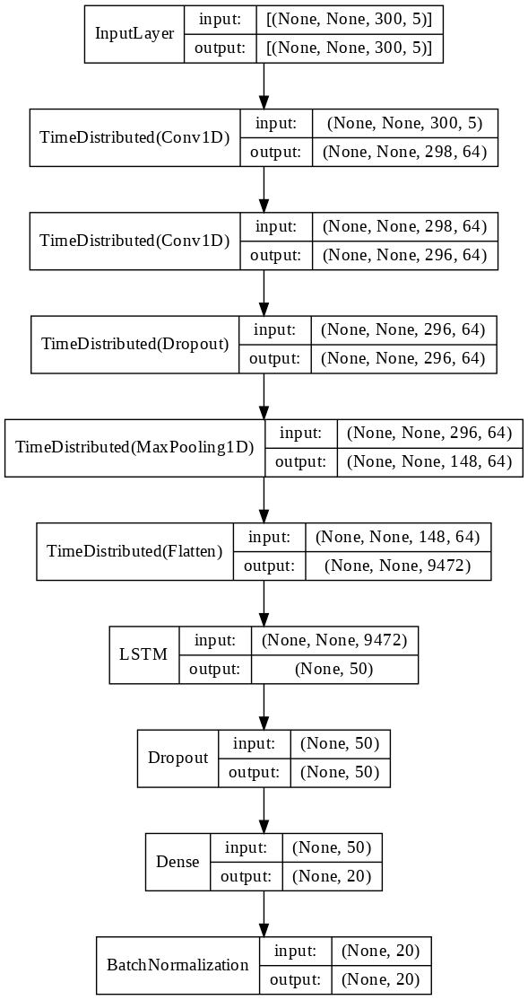

In [ ]:
tf.keras.utils.plot_model(model2, to_file='CNN_LSTM_timeseries.png', show_shapes=True, show_layer_names=False, dpi=100)

In [ ]:
# VGG16

# Create base model
base_model = keras.applications.VGG16(
    weights='imagenet',
    input_shape=(200, 250, 3),
    include_top=False)
# Freeze base model
base_model.trainable = False

# Create new model on top.
model3_inputs = keras.Input(shape=(200, 250, 3))
model3_base = base_model(model3_inputs, training=False)
model3_pooling = keras.layers.GlobalAveragePooling2D()(model3_base)
model3_drop = Dropout(0.5)(model3_pooling)
model3_dense1 = Dense(512)(model3_drop) #### first 
model3_drop2 = Dropout(0.5)(model3_dense1)
model3_dense2 = Dense(64)(model3_drop2)
model3_dense2 = BatchNormalization()(model3_dense2)

model3 = Model(model3_inputs, model3_dense2, name='VGG16')

58889256/58889256 [==============================] - 0s 0us/step


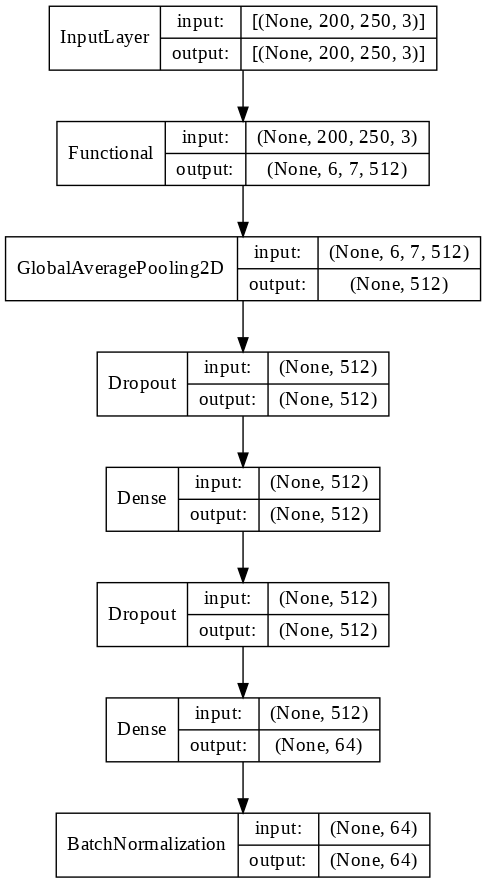

In [ ]:
tf.keras.utils.plot_model(model3, to_file='VGG_images.png', show_shapes=True, show_layer_names=False, dpi=100)

In [ ]:
concatenated = concatenate([model1_drop4, model2_dense, model3_dense2])

n_outputs = 7
out_dense = Dense(64, activation='relu')(concatenated)
out_drop = Dropout(p)(out_dense)
out_dense2 = Dense(16, activation='relu')(out_drop)
out = Dense(n_outputs, activation='softmax')(out_dense2)

def scheduler(epoch, lr):
    if epoch < 10:
        return lr
    elif lr <= 0.0001:
        return 0.0001
    else:
        return lr * tf.math.exp(-0.1)
    
callback = tf.keras.callbacks.LearningRateScheduler(scheduler, verbose=0)
opt = keras.optimizers.Adam(learning_rate=0.001)

merged_model = Model([model1_in, model2_in, model3_inputs], [out])
merged_model.compile(loss='categorical_crossentropy', optimizer=opt, metrics=['accuracy'])

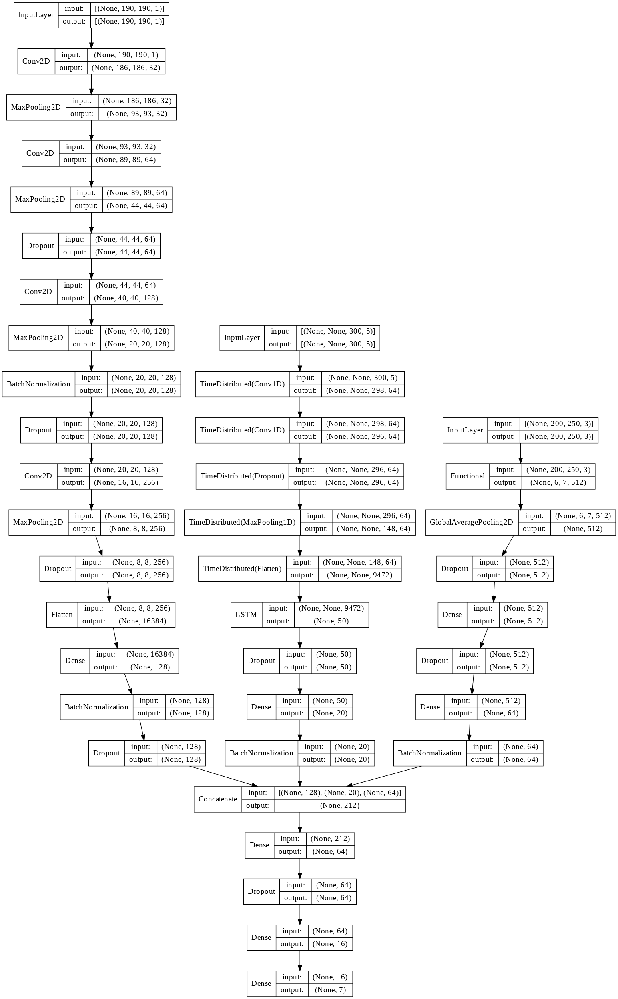

In [ ]:
tf.keras.utils.plot_model(merged_model, to_file='merged_model.png', show_shapes=True, show_layer_names=False, dpi=100)

In [ ]:
merged_model.load_weights('weights_arousal.h5')

In [ ]:
merged_model.save('arousal.h5')

In [ ]:
res_arousal = merged_model.predict([test_paths, test_time, test_images])

/usr/local/lib/python3.7/dist-packages/tensorflow/python/data/ops/structured_function.py:265: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  "Even though the `tf.config.experimental_run_functions_eagerly` "


97/97 [==============================] - 35s 213ms/step


Mean accuracy for arousal:  0.275
Accuracy for each class for arousal
0 0.46
1 0.225
2 0.175
3 0.184
4 0.199
5 0.091
6 0.505


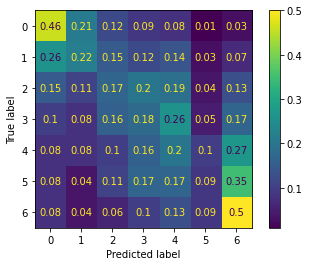

accuracy for arousal +-1 class: 0.5904514452744397
accuracy for arousal +-2 classes: 0.7810977590126664


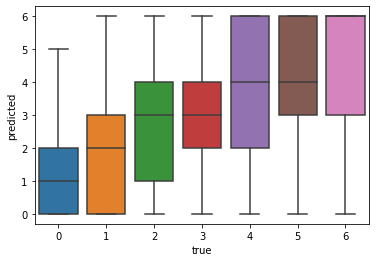

In [ ]:
# predicted = res_arousal.argmax(-1)
# np.save('predicted_arousal', predicted)

predicted = np.load('predicted_arousal.npy')
true = test_y_a.argmax(-1)

print('Mean accuracy for arousal: ', np.round(sum(predicted == true) / len(true), 3))
print('Accuracy for each class for arousal')
for i in range(7):
    print(i,  np.round(sum(predicted[true == i] == i) / sum(true == i), 3))  
    
cm = confusion_matrix(true, predicted)
percent = np.round(cm / (cm.sum(axis=1)[None, :].T), 2)
cm_display = ConfusionMatrixDisplay(percent).plot()
plt.show()

sum_ = 0
for t, p in zip(true, predicted):
    if abs(t-p) <= 1:
        sum_ +=1
print('accuracy for arousal +-1 class:', sum_/len(true))

sum_ = 0
for t, p in zip(true, predicted):
    if abs(t-p) <= 2:
        sum_ +=1
print('accuracy for arousal +-2 classes:', sum_/len(true))


df = pd.DataFrame({'predicted':predicted, 'true':true})
sns.boxplot(y='predicted', data=df, x='true', showfliers=False)
#sns.swarmplot(data=df, y="predicted", x="true", s=)
plt.show()

In [ ]:
# import gc
# gc.collect()

26164

In [ ]:
merged_model.load_weights('weights_valence.h5')

In [ ]:
merged_model.save('valence.h5')

In [ ]:
res_valence = merged_model.predict([test_paths, test_time, test_images])

/usr/local/lib/python3.7/dist-packages/tensorflow/python/data/ops/structured_function.py:265: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  "Even though the `tf.config.experimental_run_functions_eagerly` "


97/97 [==============================] - 35s 215ms/step


Mean accuracy for valence:  0.295
Accuracy for each class for valeence
0 0.456
1 0.279
2 0.375
3 0.283
4 0.198
5 0.307
6 0.465


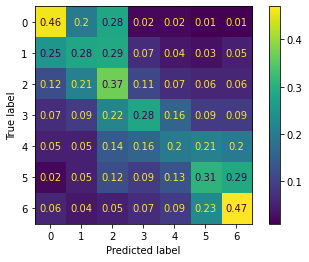

accuracy for valence +-1 class: 0.6586554075998701
accuracy for valence +-2 classes: 0.8684637869438129


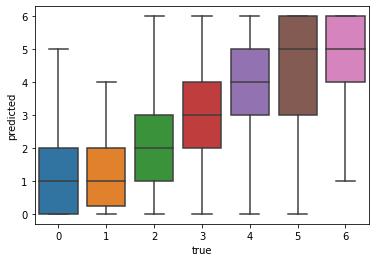

In [ ]:
predicted = res_valence.argmax(-1)
np.save('predicted_valence', predicted)

predicted = np.load('predicted_valence.npy')
true = test_y_v.argmax(-1)

print('Mean accuracy for valence: ', np.round(sum(predicted == true) / len(true), 3))
print('Accuracy for each class for valeence')
for i in range(7):
    print(i,  np.round(sum(predicted[true == i] == i) / sum(true == i), 3))  
    
cm = confusion_matrix(true, predicted)
percent = np.round(cm / (cm.sum(axis=1)[None, :].T), 2)
cm_display = ConfusionMatrixDisplay(percent).plot()
plt.show()

sum_ = 0
for t, p in zip(true, predicted):
    if abs(t-p) <= 1:
        sum_ +=1
print('accuracy for valence +-1 class:', sum_/len(true))

sum_ = 0
for t, p in zip(true, predicted):
    if abs(t-p) <= 2:
        sum_ +=1
print('accuracy for valence +-2 classes:', sum_/len(true))


df = pd.DataFrame({'predicted':predicted, 'true':true})
sns.boxplot(y='predicted', data=df, x='true', showfliers=False)
#sns.swarmplot(data=df, y="predicted", x="true", s=)
plt.show()

# Test of political pics

In [ ]:
polit_paths = np.load('politics/polit_paths.npy')
polit_pics = np.load('politics/polit_pics.npy')
polit_tim_data = np.load('politics/polit_tim_data.npy')

polit_tim_data = polit_tim_data[:, None, :, :]
polit_paths = polit_paths[:, :, :, None]

# arousal
mean_eyetrack_im, std_eyetrack_im = 7.131651555358986, 36.16908424287419
mean_pics, std_pics = 112.8596743479614, 73.17328261021949
mean_time = [0.47930163769475365, 0.5025483869187797, 3.1917097768767384, 0.00028441952899300294, -0.028459507535657676]
std_time =[0.13809510924886878, 0.18233709273559534, 0.5665284210514095, 0.9589779244665103, 0.900008415925623]

nans = np.isnan(polit_tim_data) 
print(nans.sum())
polit_tim_data[nans] = mean_time[-1]
nans = np.isnan(polit_tim_data) 
print(nans.sum())

x1_images = (polit_paths - mean_eyetrack_im) / std_eyetrack_im
all_images = (polit_pics - mean_pics) / std_pics
for i, mean, std in zip(range(5), mean_time, std_time):
    polit_tim_data[:, :, :, i] = (polit_tim_data[:, :, :, i] - mean)/std

In [ ]:
merged_model.load_weights('weights_arousal.h5')

In [ ]:
arousal_politics = merged_model.predict([polit_paths, polit_tim_data, np.concatenate([polit_pics]*30)])
arousal_politics = arousal_politics.argmax(-1)
arousal_politics +=1
np.save('arousal_politics', arousal_politics)

15/15 [==============================] - 3s 226ms/step


In [ ]:
polit_paths = np.load('politics/polit_paths.npy')
polit_pics = np.load('politics/polit_pics.npy')
polit_tim_data = np.load('politics/polit_tim_data.npy')

polit_tim_data = polit_tim_data[:, None, :, :]
polit_paths = polit_paths[:, :, :, None]

# valence
mean_eyetrack_im, std_eyetrack_im = 7.221206373518936, 36.36375114631994
mean_pics, std_pics = 112.58524645266107, 72.8678856743275
mean_time = [0.474979143899135, 0.5084496562556537, 3.1761275344961803, -0.00626148824116919, -0.011207830193312656]
std_time = [0.14301775240641512, 0.1960988680713403, 0.5843657264344913, 1.0180995129880201, 0.948138649624869]

nans = np.isnan(polit_tim_data) 
print(nans.sum())
polit_tim_data[nans] = mean_time[-1]
nans = np.isnan(polit_tim_data) 
print(nans.sum())

x1_images = (polit_paths - mean_eyetrack_im) / std_eyetrack_im
all_images = (polit_pics - mean_pics) / std_pics
for i, mean, std in zip(range(5), mean_time, std_time):
    polit_tim_data[:, :, :, i] = (polit_tim_data[:, :, :, i] - mean)/std

4500
0


In [ ]:
merged_model.load_weights('weights_valence.h5')

In [ ]:
valence_politics = merged_model.predict([polit_paths, polit_tim_data, np.concatenate([polit_pics]*30)])
valence_politics = valence_politics.argmax(-1)
valence_politics +=1
np.save('valence_politics', valence_politics)

15/15 [==============================] - 3s 230ms/step


In [ ]:
arousal_politics, valence_politics

(array([6, 5, 5, 5, 4, 5, 6, 6, 5, 6, 5, 6, 6, 6, 7, 4, 2, 2, 5, 2, 5, 6,
        5, 5, 6, 5, 6, 6, 5, 6, 5, 4, 5, 5, 4, 5, 5, 5, 5, 5, 5, 5, 5, 5,
        5, 5, 4, 4, 5, 4, 5, 5, 5, 5, 6, 5, 5, 6, 5, 6, 5, 5, 5, 5, 4, 5,
        5, 5, 5, 5, 5, 5, 5, 3, 5, 6, 4, 4, 5, 4, 5, 5, 5, 5, 5, 5, 6, 5,
        3, 5, 6, 5, 5, 5, 4, 5, 6, 5, 5, 5, 5, 6, 6, 5, 6, 5, 4, 4, 5, 4,
        5, 6, 5, 5, 5, 5, 6, 6, 5, 7, 4, 4, 4, 5, 4, 5, 6, 5, 5, 5, 5, 5,
        6, 5, 6, 7, 5, 4, 6, 5, 6, 7, 6, 6, 4, 6, 6, 6, 4, 7, 5, 4, 5, 5,
        4, 5, 5, 5, 5, 5, 5, 6, 6, 5, 7, 4, 5, 5, 5, 3, 5, 6, 5, 5, 5, 5,
        6, 6, 5, 6, 5, 3, 4, 5, 4, 5, 5, 5, 5, 5, 5, 5, 5, 3, 5, 5, 5, 4,
        5, 4, 5, 5, 5, 5, 5, 5, 6, 6, 5, 5, 5, 4, 4, 5, 4, 5, 6, 5, 5, 6,
        5, 7, 6, 4, 5, 4, 3, 3, 5, 4, 5, 6, 5, 5, 6, 5, 6, 6, 5, 5, 5, 4,
        4, 5, 4, 5, 6, 5, 5, 6, 5, 6, 6, 5, 6, 5, 4, 3, 5, 5, 4, 6, 5, 5,
        5, 5, 5, 6, 5, 5, 5, 4, 5, 5, 4, 5, 5, 5, 5, 5, 5, 6, 6, 5, 7, 4,
        4, 5, 5, 4, 5, 5, 5, 5, 6, 5, 

In [ ]:
picnames = ['1.png', '2.png', '3.png', '4.jpg', '5.jpg', '6.jpg', '7.png', '8.png', '9.png', '10.png', '11.png', '12.jpg', 'n1.PNG', 'n2.PNG', 'n3.PNG']

df = {'picture_name':[], 'arousal_level':[], 'valence_level':[]}

for i, pic in enumerate(picnames):
    df['picture_name'] = df['picture_name']+[pic]*30
    df['arousal_level'] = df['arousal_level']+list(arousal_politics[i::15])
    df['valence_level'] = df['valence_level']+list(valence_politics[i::15])
    
df = pd.DataFrame(df)

In [ ]:
df.to_csv('prediction_for_politics.csv')

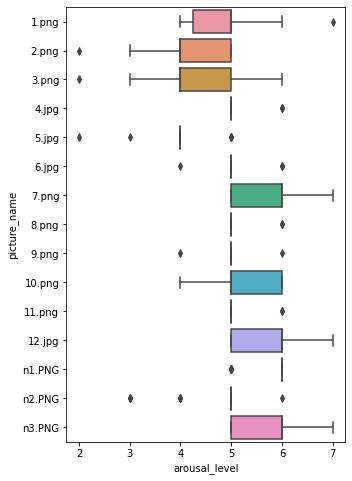

In [ ]:
plt.figure(figsize=(5, 8))
sns.boxplot(y='picture_name', data=df, x='arousal_level', showfliers=True, orient='horizontal')
#sns.swarmplot(data=df, y="picture_name", x="arousal_level", s=4)

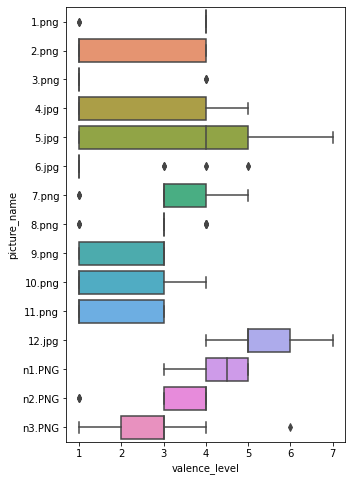

In [ ]:
plt.figure(figsize=(5, 8))
sns.boxplot(y='picture_name', data=df, x='valence_level', showfliers=True, orient='horizontal')
#sns.swarmplot(data=df, y="picture_name", x="valence_level", s=3)

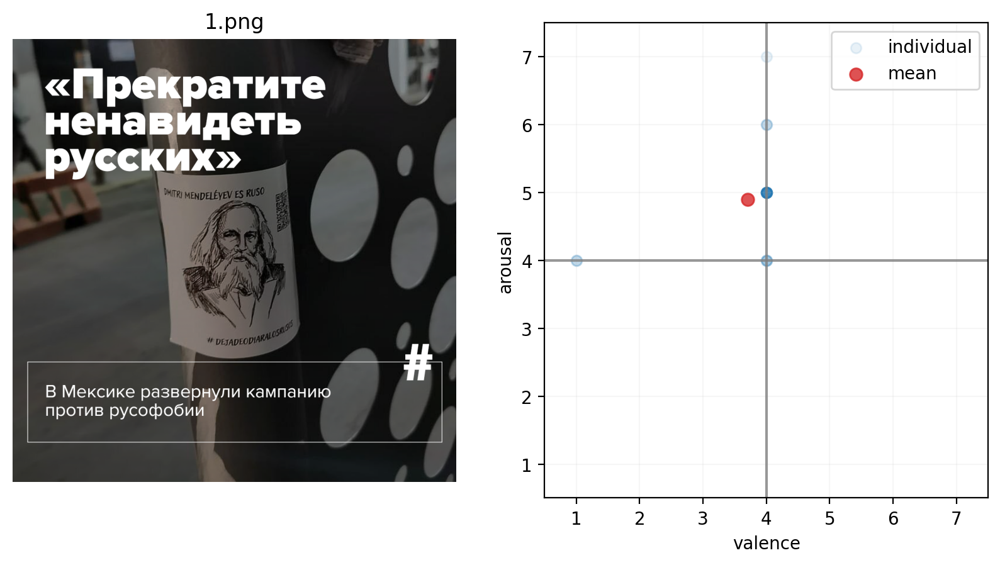

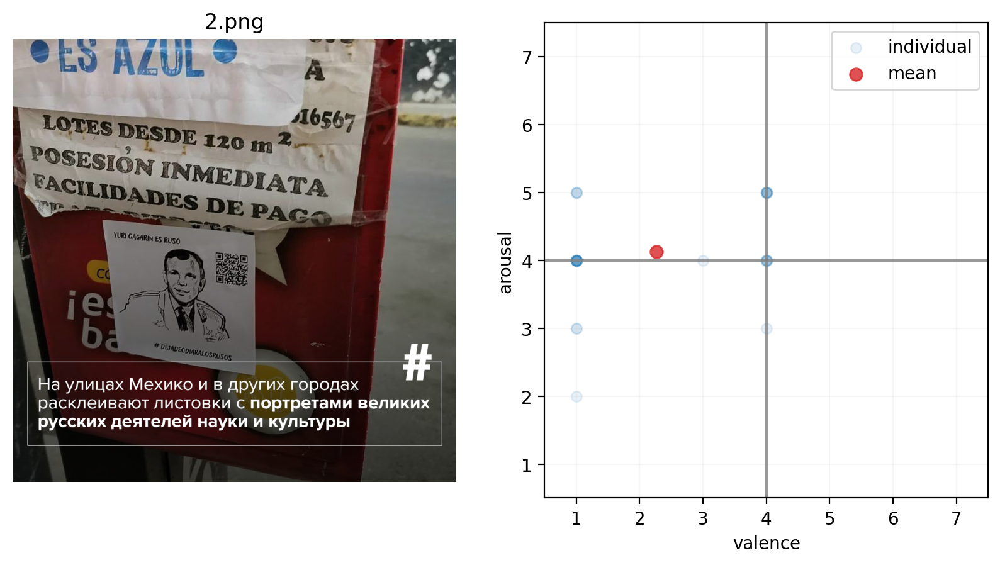

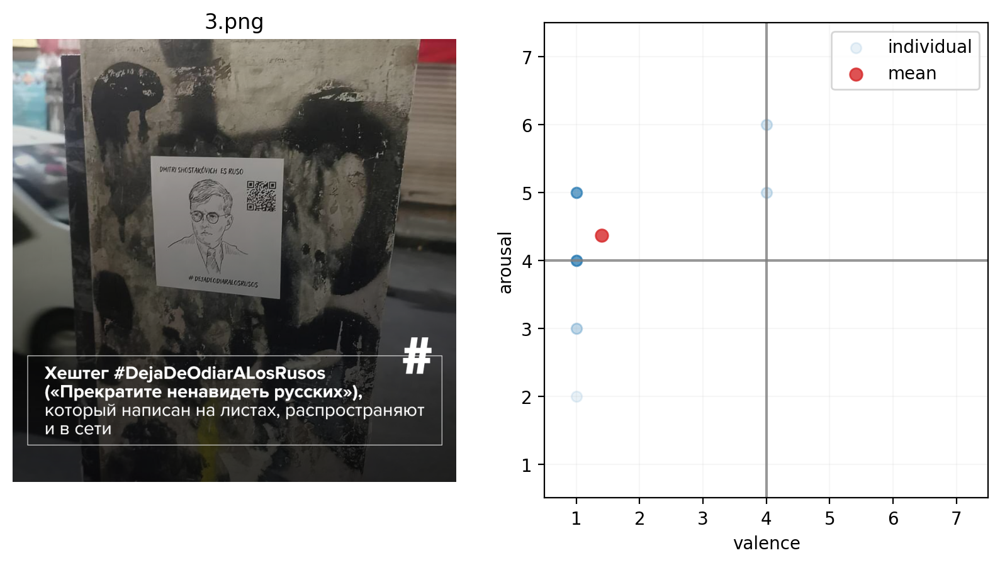

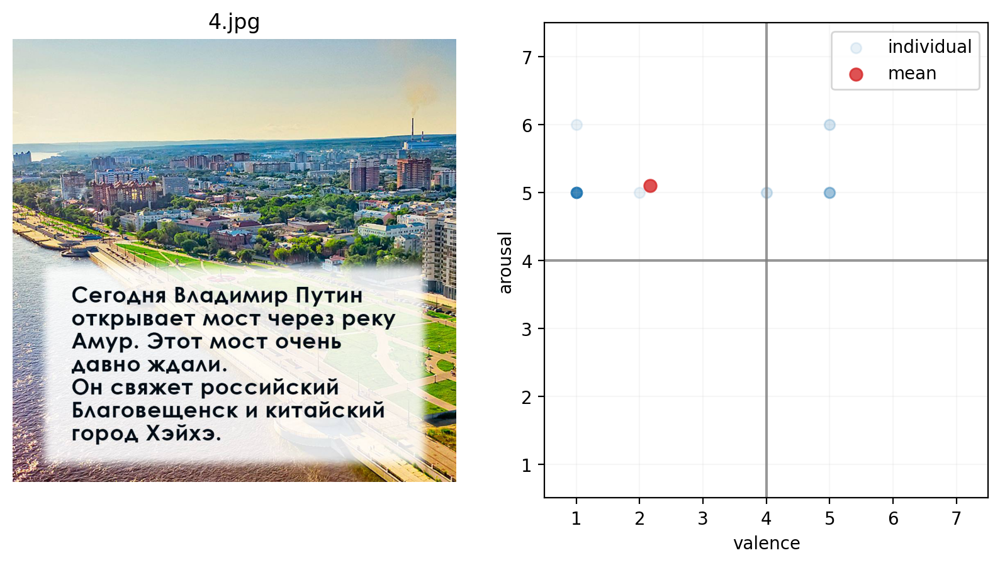

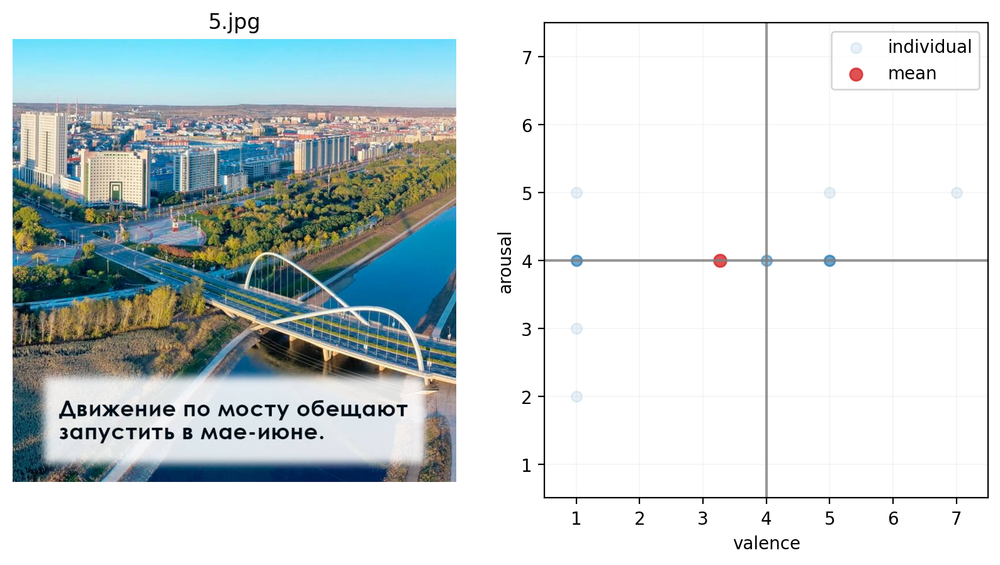

...

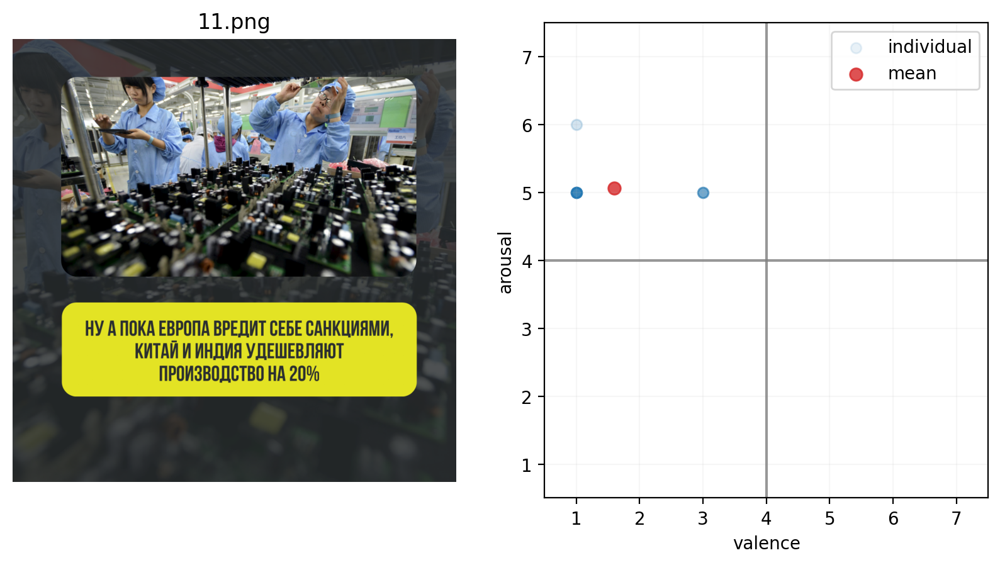

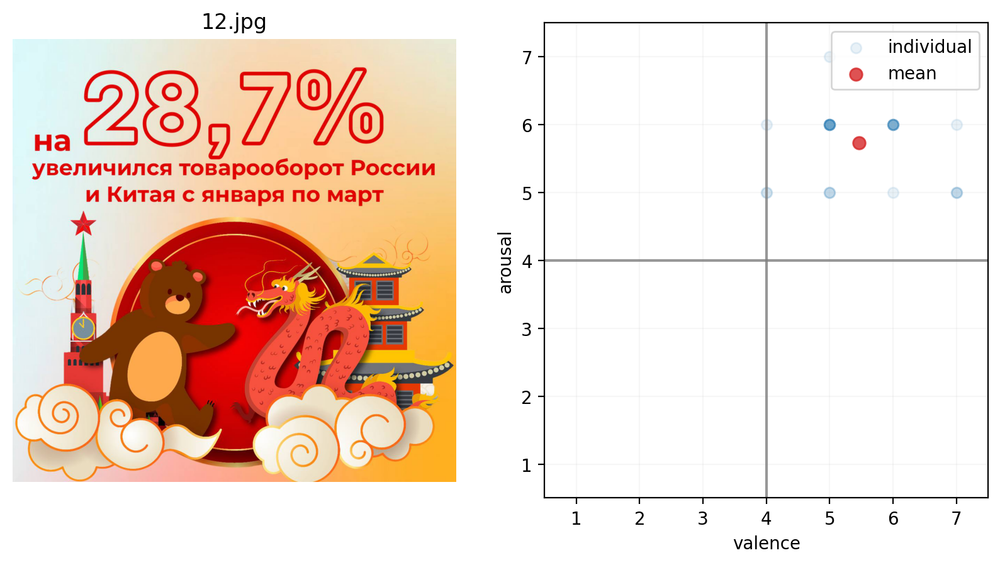

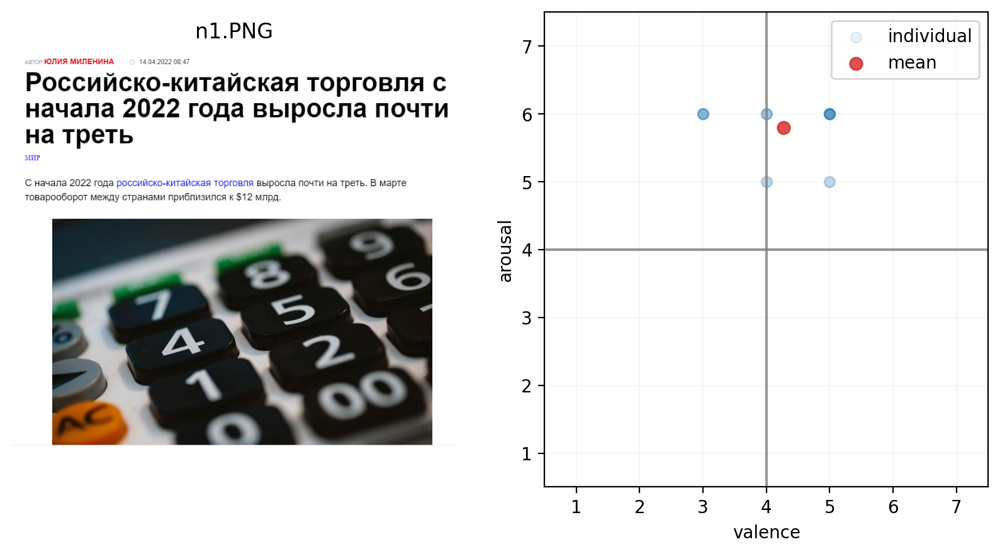

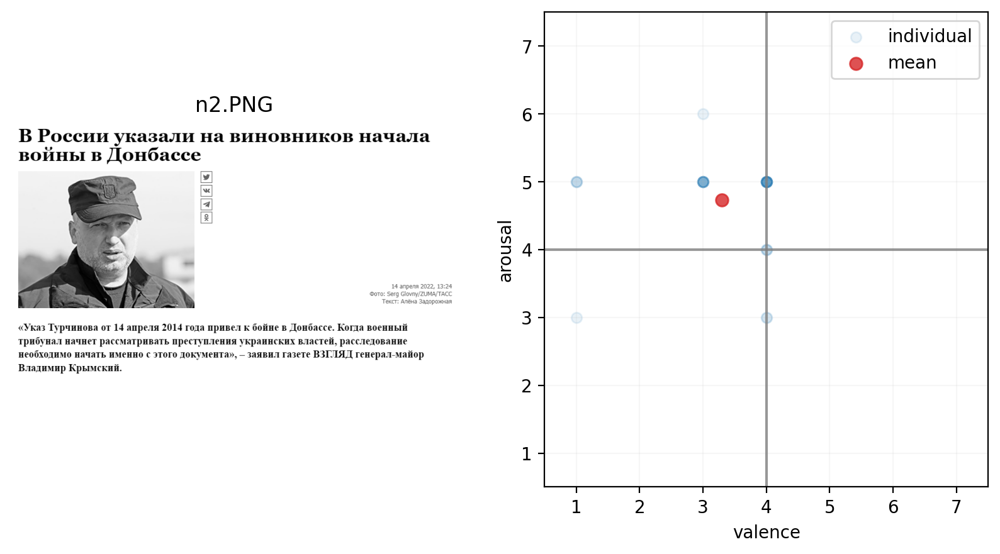

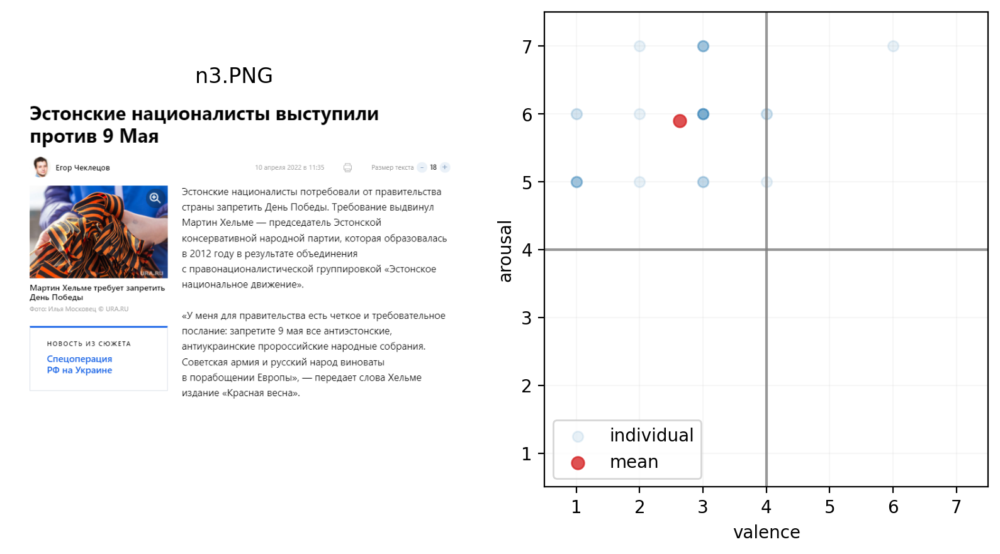

In [ ]:
for pic in picnames:
    fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(10, 5), dpi=200)
    
    
    ax[1].scatter(df[df.picture_name == pic].valence_level, df[df.picture_name == pic].arousal_level, alpha = 0.05, label='individual')
    ax[1].scatter(df[df.picture_name == pic].valence_level.mean(), df[df.picture_name == pic].arousal_level.mean(), c='tab:red', alpha = 0.8, s=50, label='mean')
    ax[1].set_xlabel('valence')
    ax[1].set_ylabel('arousal')
#    circle = plt.Circle((4, 4), radius=3.5, color='black', fill=False)
#    ax.add_patch(circle)
    ax[1].plot([0, 8], [4, 4], c='tab:gray', alpha=0.8)
    ax[1].plot([4, 4], [0, 8], c='tab:gray', alpha=0.8)
    ax[1].set_xlim(0.5, 7.5)
    ax[1].set_ylim(0.5, 7.5)
    ax[1].set_xticks([1, 2, 3, 4, 5, 6, 7])
    ax[1].set_yticks([1, 2, 3, 4, 5, 6, 7])
    ax[1].grid(alpha=0.1)
    ax[1].legend()
    
    ax[0].set_title(pic)
    img = mpimg.imread('pics/'+pic)
    ax[0].imshow(img)
    
    ax[0].set_axis_off()
    
    plt.savefig('res/'+pic[:-3]+'jpg')